# 1. Introduction to Support Vector Machines

- Support Vector Machine” (SVM) is a supervised machine learning algorithm which can be used for both classification or regression challenges.

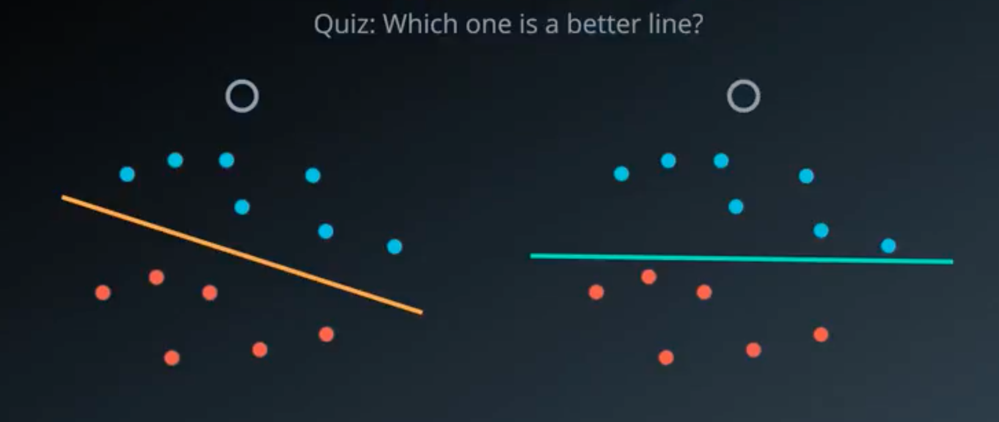

#### Question:
- Which line better seperates the points (line on the left or line on the right)?

#### Answer:
- Line on the left (yellow one) seperates points the best
- Why?
    - Compare the distance of points to the closest point on the line and find the closes point in both the scenerios
    - Check which of these closest points are farthest from the line

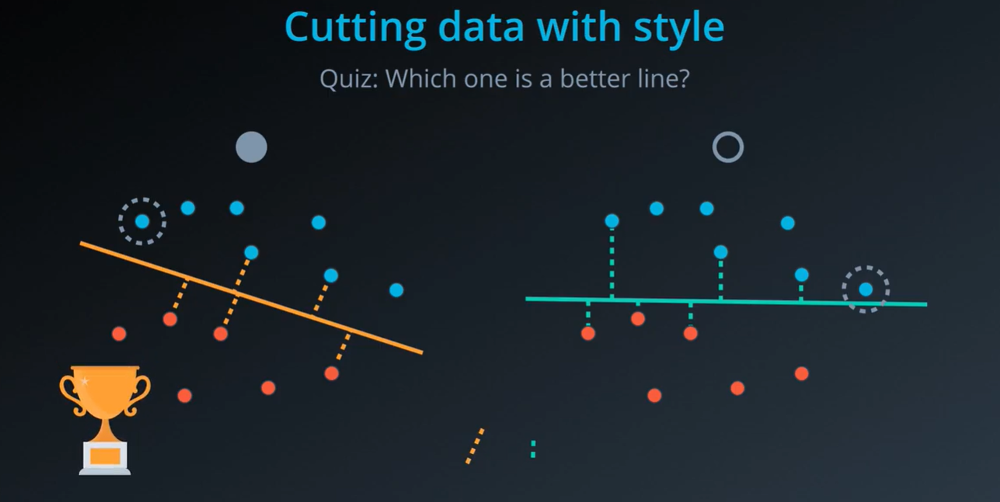

# 2. Error Function

- Consider a classification, where we have some blue points and some red points and we want to __find a boundary__ that separates them
- We also want the boundary to be as far away from the points as possible, so we try to maximize the margin as shown below.

### Case 1
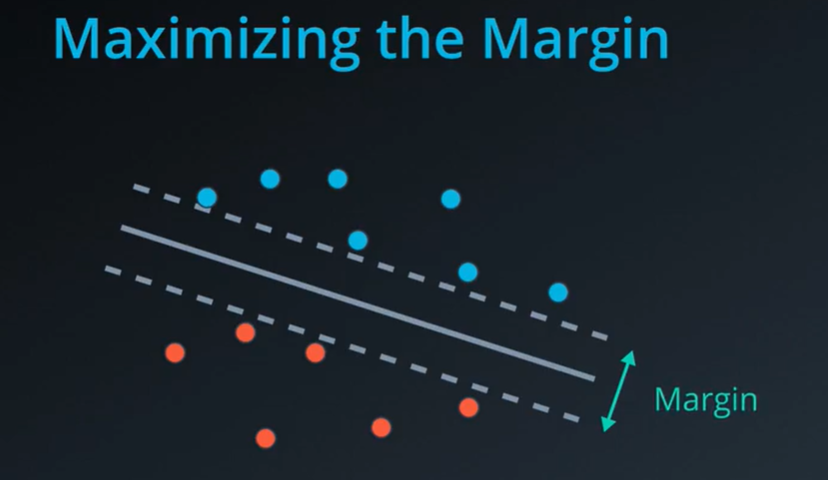

### There are two ways to measure this model
- How many points have been mis-classified?
- How wide the margin is?

### Case 2
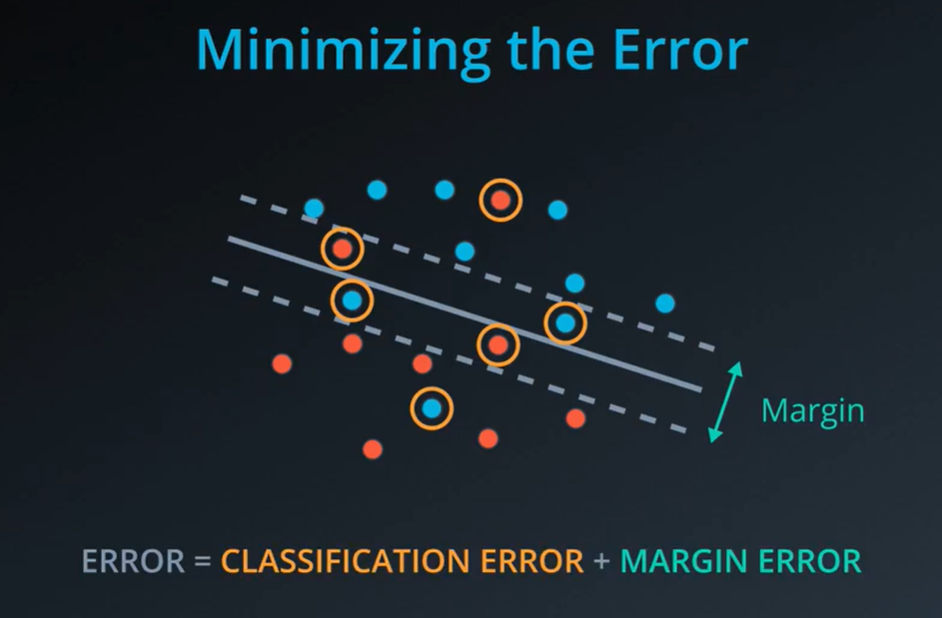

### In SVM Algorithm, we will try to minimize the error: `Error = Classification Error + Margin Error`

# 3. Perceptron Algorithm

- Points that are closer to the line gets punished less, whereas the points that are farther away from the line gets punished more.

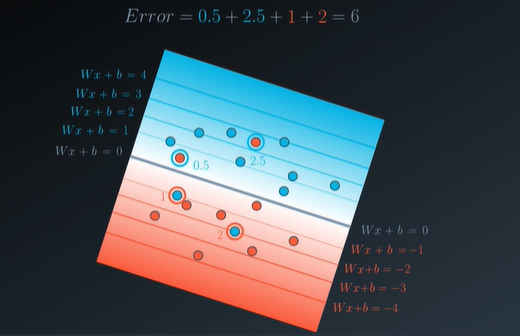

# 4. Classification Error

- Suppose we have a set of points and a line which separtes them 
- Let's say the equation of the line is Wx + b = 0 
- We have a margin as well created by lines Wx + b = 1 and Wx +b = -1
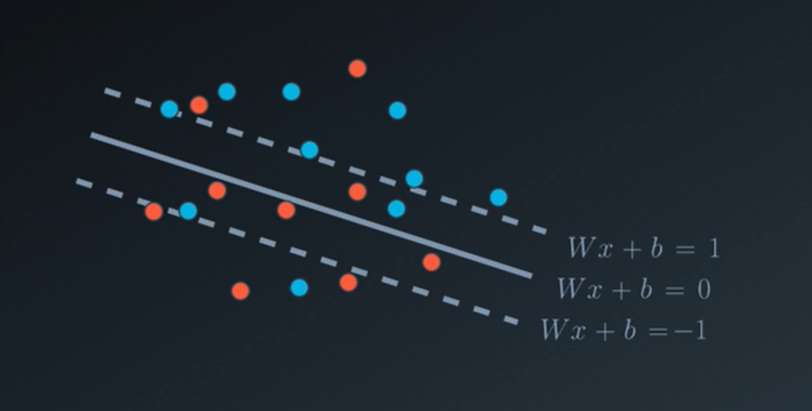

- We still want to punish the points that are incorrectly classified
- We don't want any points in the margin region as well
- Our blue error starts from bottom line i.e. from Wx + b = -1 to upwards
- Our red error starts from top line i.e. from Wx + b = 1 to downwards

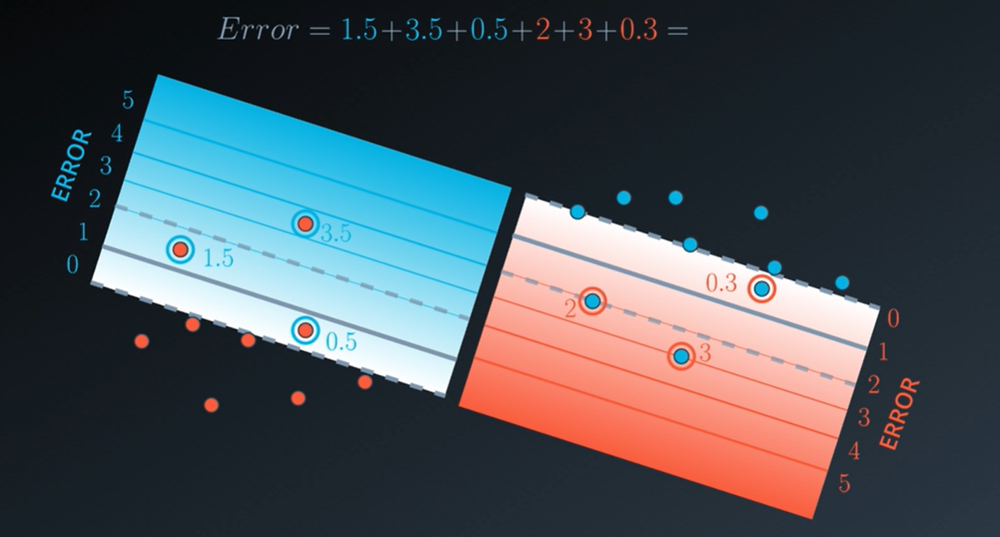

- This error would be the classification error for Support Vector Machines

# 5. Margin Error

- Margin is the distance between the two lines
- Model in the left has large margin
- Model in the right has small margin
- We want to turn this margin into error that we can minimize using gradient descent
- This is because we want to build a model with large margins, so, goal is to punish models with small margins
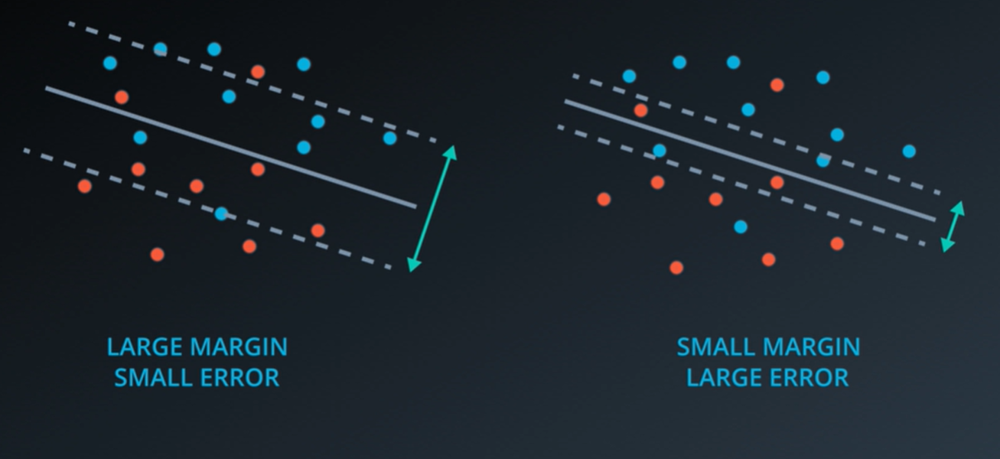

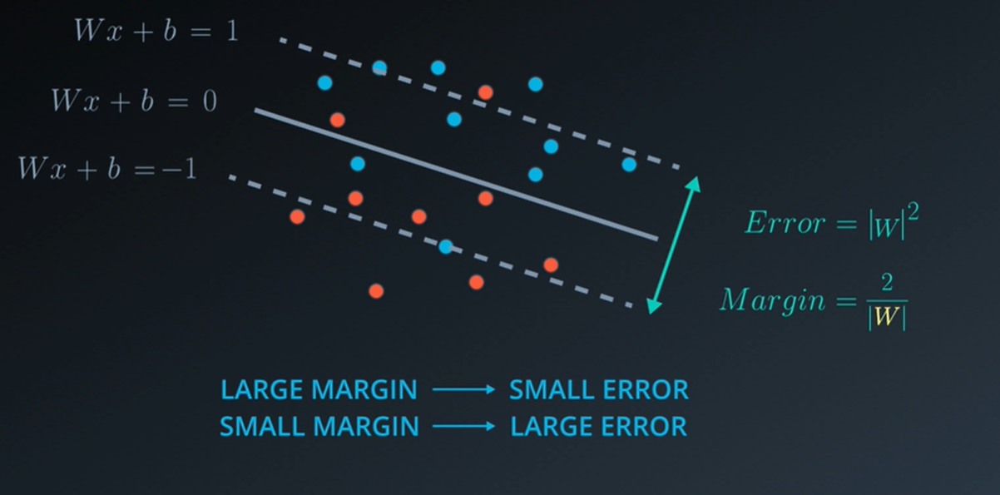

### Example 1:

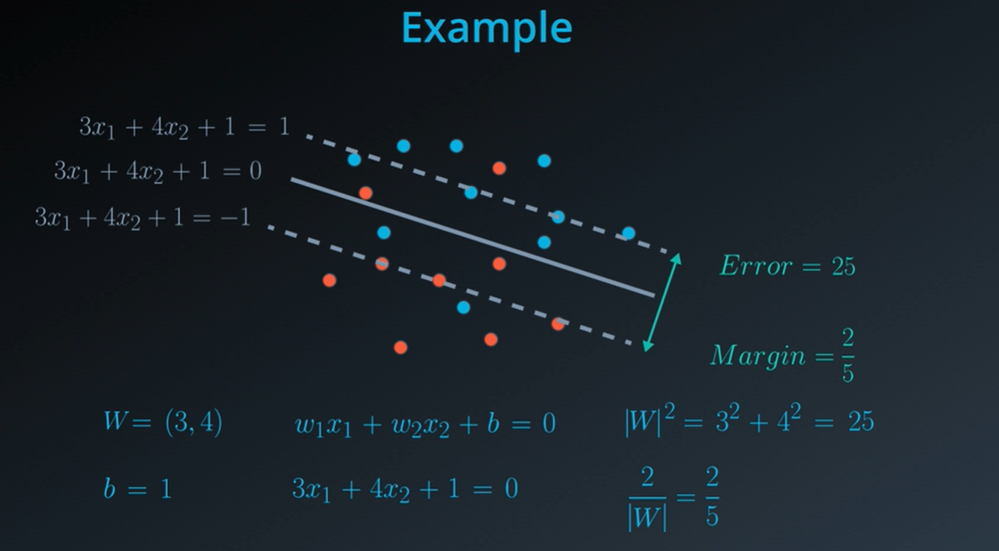

### Example 2:

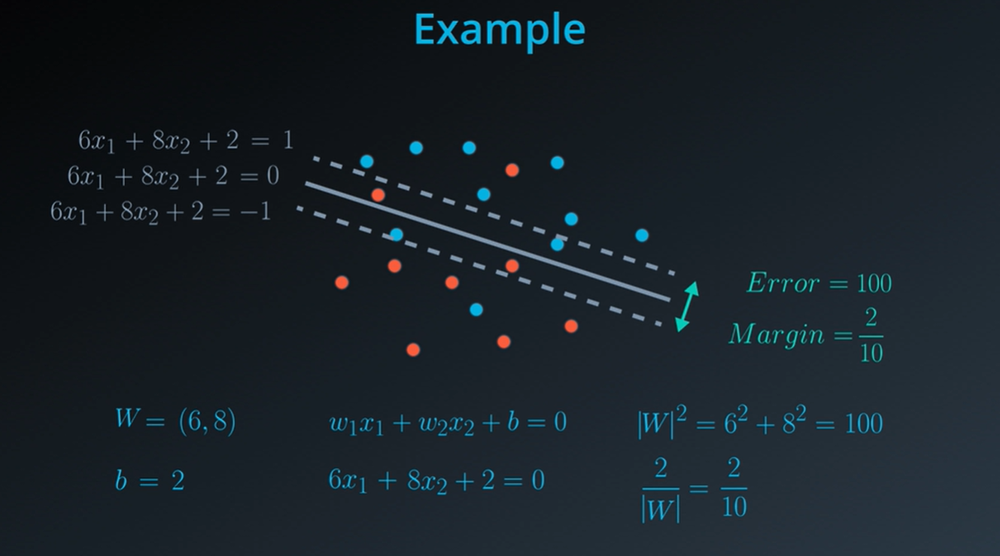

### Conclusion:

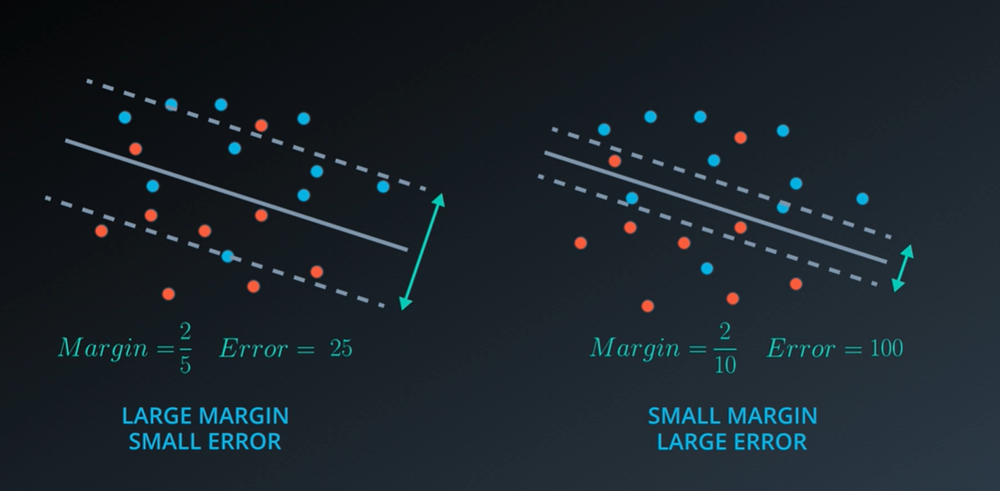

# 6. Error Function

- Error = Classification Error + Margin Error
- We minimize this error by gradient descent

# 7. The C Parameter

- C Parameter is the constant that is attached to the classification error
- Error = __C__* Classification Error + Margin Error
    - Large C = Focus on classifying points
    - Small C = Focus on a large margin
- C is a hyperparameter

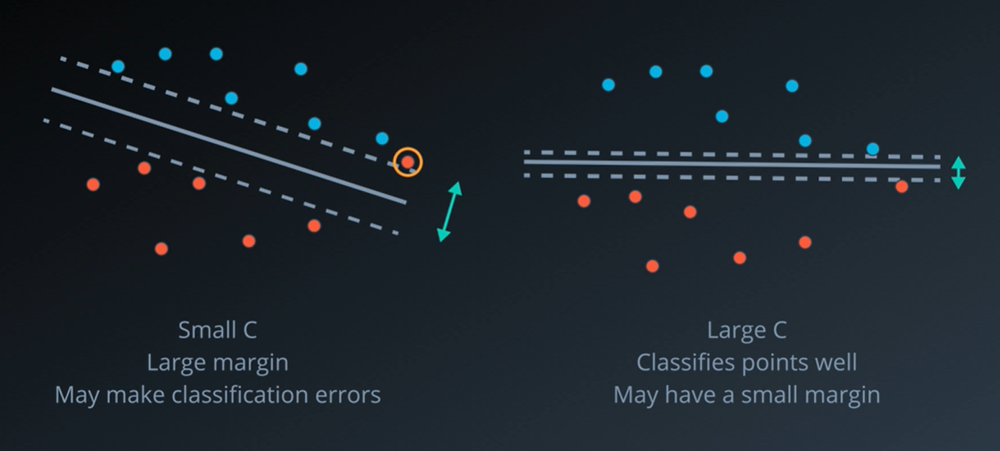

# 8. Polynomial Kernal

## Example 1:

#### Case1: Blue and  Red points are easily separable
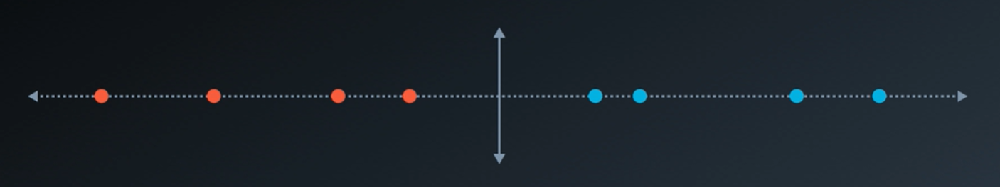

#### Case2: Blue and  Red points are not easily separable
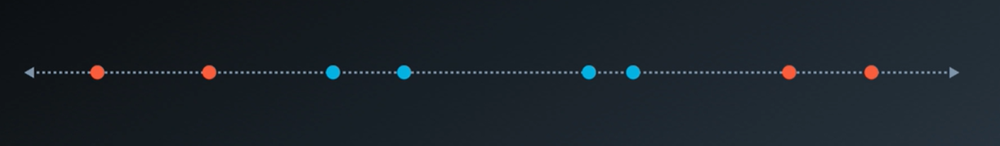


- We have to separate the blue and the red points here
- Lift each points to corresponding place in the parabola
- All of a sudden all points are easily separable
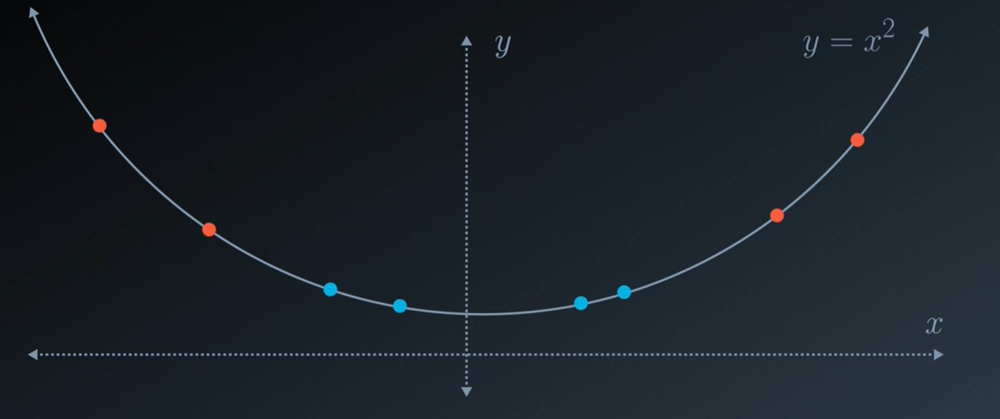

- We can find the good cut at y = 4
- We have solutions at x = -2 and x = 2
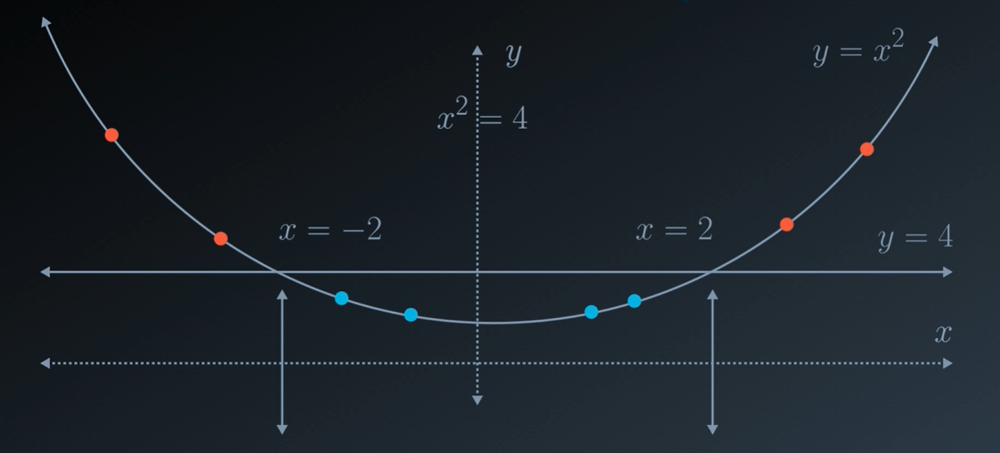

- We bring this line down again and we have the solutions x = -2 and x = 2
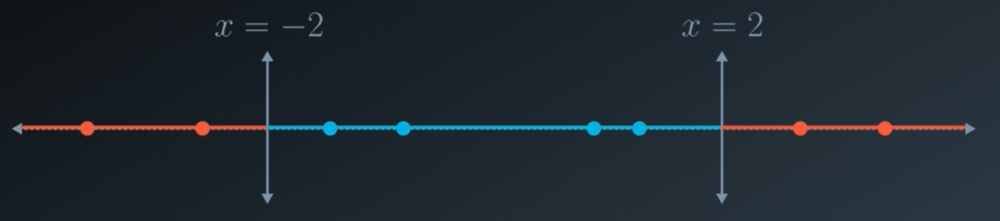

- x = -2 and x = 2 are the points that creates our boundary and, the trick is called kernal trick

## Example 2:

#### Suppose we want to separate the blue and the red points

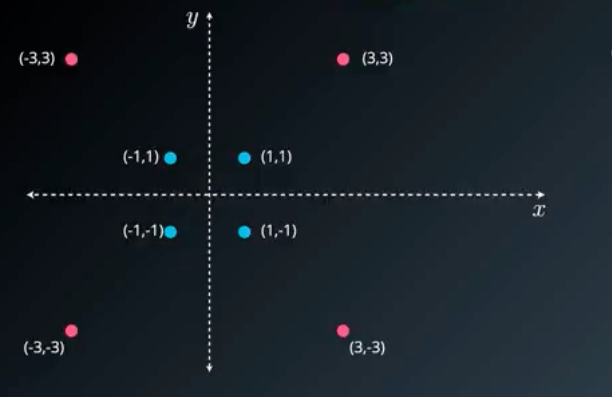

#### Clearly, $x^2 + y^2$ can separate these points

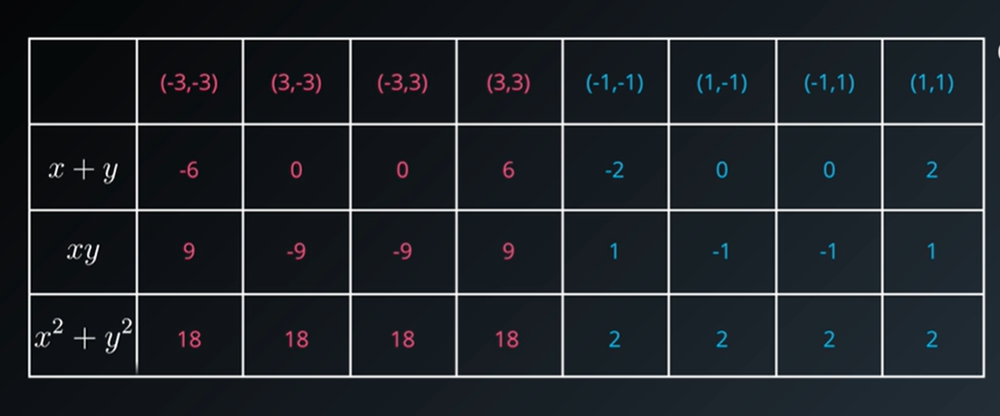

#### Circle seperates the blue and the red points
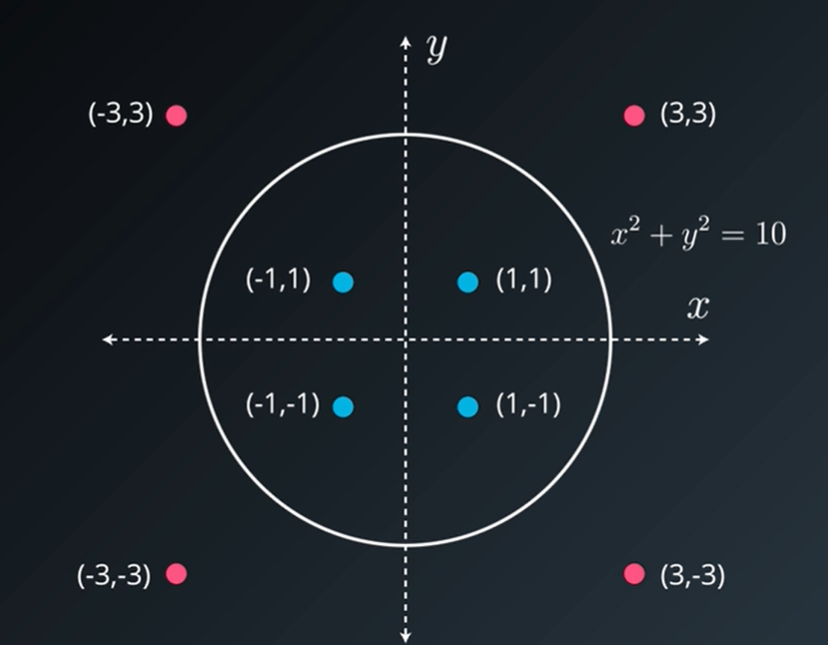

#### Linear vs Polynomial Kernal

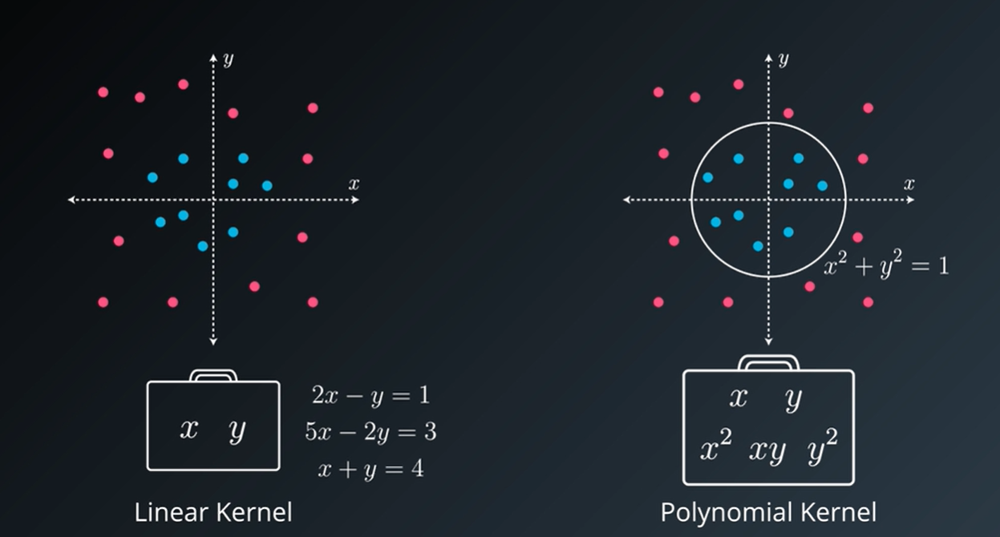

# 9. RBF (Radial Basis Function) Kernal

#### Clearly, no line would separate these blue and the red points

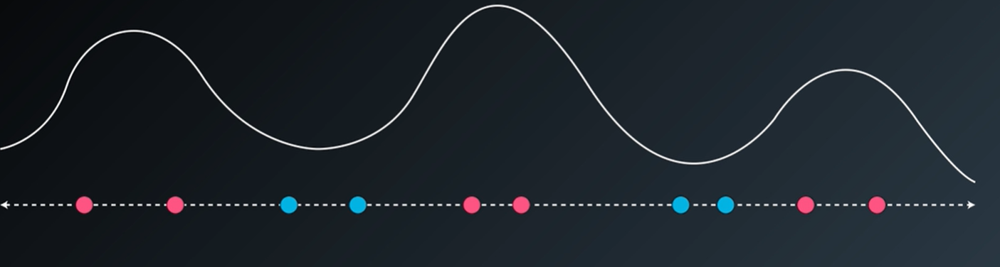

#### Let's move these points to corresponding points in the mountain range. Clearly, the blue points end up in valleys whereas the red points end up in high range

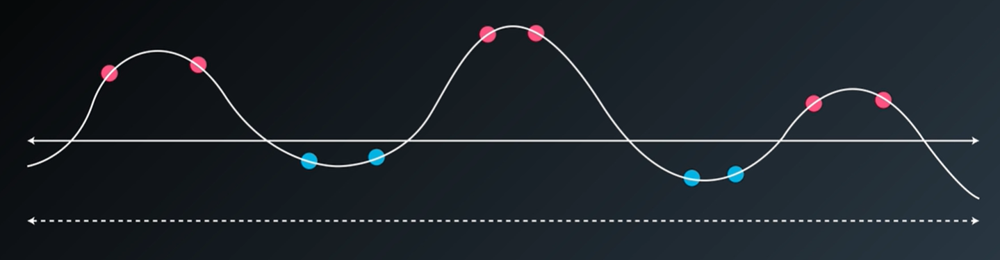

#### Find the solutions where the mountain range cuts the line which separate these points and then, project these points down

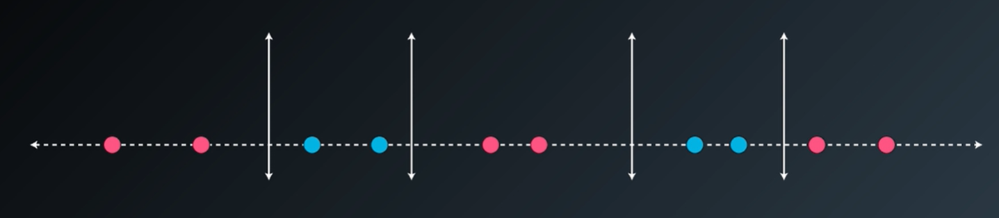

#### Now the question arises, how do we build the mountain range which locates the blue points on high range and red points in the valley, the technical term for these mountains is "RBF"

#### Deciding on the value of gamma

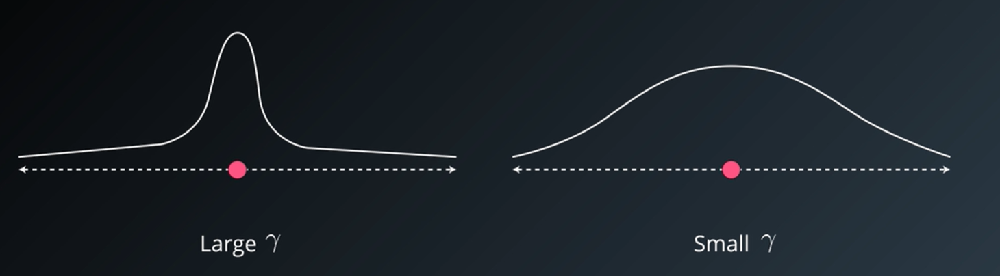

#### Large value of gamma tend to overfit whereas the small values of gamma tend to underfit
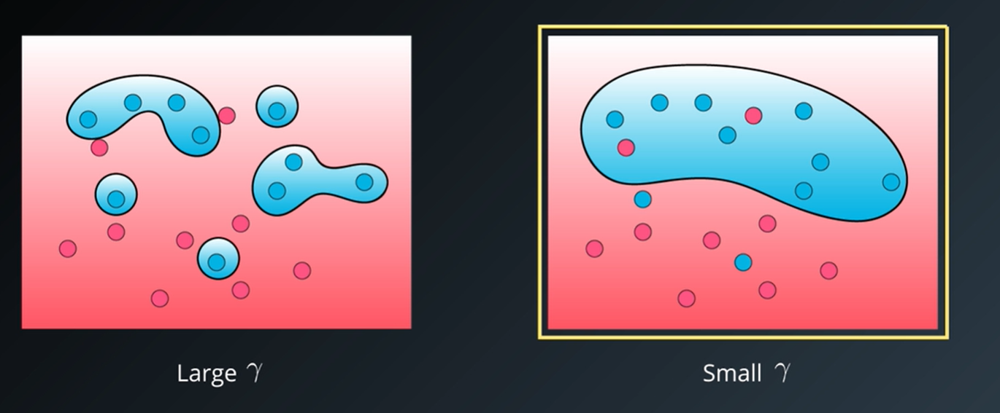

# 10. SVMs in sklearn

In [1]:
# Import Libraries
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [2]:
# Read the data
data = pd.read_csv('svm_data.csv', header = None)
data.head()

,0,1,2
0,0.24539,0.81725,0
1,0.21774,0.76462,0
2,0.20161,0.69737,0
3,0.20161,0.58041,0
4,0.24770,0.49561,0


In [3]:
# Assign the features to the variable X, and the labels to the variable y.
X = data[[0, 1]]
y = data[[2]]

### Hyperparameters
- When we define the model, we can specify the hyperparameters. The most common ones are

1. __C__: The C parameter.
2. __kernel__: The kernel. The most common ones are 'linear', 'poly', and 'rbf'.
3. __degree__: If the kernel is polynomial, this is the maximum degree of the monomials in the kernel.
4. __gamma__ : If the kernel is rbf, this is the gamma parameter.

### Model 1:

In [4]:
# Create the model and assign it to the variable model.
# Find the right parameters for this model to achieve 100% accuracy on the dataset.
model1 = SVC(kernel='rbf', gamma=27)

In [5]:
# Fit the model.
model1.fit(X,y)

C:\Users\sarora117\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


SVC(gamma=27)

In [6]:
# Make predictions. Store them in the variable y_pred.
y_pred1 = model1.predict(X)

In [7]:
# Calculate the accuracy and assign it to the variable acc.
acc1 = accuracy_score(y, y_pred1)
acc1

1.0

### Model 2:

In [8]:
# Create the model and assign it to the variable model.
# Find the right parameters for this model to achieve 100% accuracy on the dataset.
model2 = SVC(kernel='poly', degree=4, C=0.1)

In [9]:
# Fit the model.
model2.fit(X,y)

C:\Users\sarora117\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


SVC(C=0.1, degree=4, kernel='poly')

In [10]:
# Make predictions. Store them in the variable y_pred.
y_pred2 = model1.predict(X)

In [11]:
# Calculate the accuracy and assign it to the variable acc.
acc2 = accuracy_score(y, y_pred2)
acc2

1.0